EEG DATA ANALYSIS

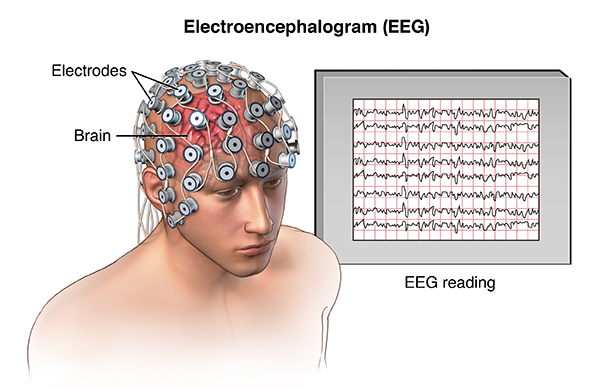

OVERVIEW:
An electroencephalogram (EEG) is a test that measures electrical activity in the brain using small, metal discs (electrodes) attached to the scalp. Brain cells communicate via electrical impulses and are active all the time, even during asleep. This activity shows up as wavy lines on an EEG recording.

An EEG is one of the main diagnostic tests for epilepsy. An EEG can also play a role in diagnosing other brain disorders.

WHY IT'S DONE:
An EEG can find changes in brain activity that might be useful in diagnosing brain disorders, especially epilepsy or another seizure disorder. An EEG might also be helpful for diagnosing or treating:

Brain tumors
Brain damage from head injury
Brain dysfunction that can have a variety of causes (encephalopathy)
Sleep disorders
Inflammation of the brain (herpes encephalitis)
Stroke
Sleep disorders
Creutzfeldt-Jakob disease
An EEG might also be used to confirm brain death in someone in a persistent coma. A continuous EEG is used to help find the right level of anesthesia for someone in a medically induced coma.

METHODOLOGY: We took a EEG dataset from kaggle. This data is defined as:(We collected EEG signal data from 10 college students while they watched MOOC video clips. We extracted online education videos that are assumed not to be confusing for college students, such as videos of the introduction of basic algebra or geometry. We also prepare videos that are expected to confuse a typical college student if a student is not familiar with the video topics like Quantum Mechanics, and Stem Cell Research. We prepared 20 videos, 10 in each category. Each video was about 2 minutes long. We chopped the two-minute clip in the middle of a topic to make the videos more confusing). 

Then we have carried out the following Operations in the order as follows:

1) Importing Libraries

2) Reading Data

3) Splitting Data into Training and Testing Data

4) Feature Scaling

5) Impleneting Naive Bayes

6) Implenting PCA

7) Implementing Decision Tree

8) Implementing KNN

9) Implementing SVM

10) Implementing Logistic Regression

11) Implenting HAC

In [87]:
#Importing Basic Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

In [42]:
#Reading Data
data = pd.read_csv("EEG_data.csv")
data.head()

,SubjectID,VideoID,Attention,Mediation,Raw,Delta,Theta,Alpha1,Alpha2,Beta1,Beta2,Gamma1,Gamma2,predefinedlabel,user-definedlabeln
0,0.0,0.0,56.0,43.0,278.0,301963.0,90612.0,33735.0,23991.0,27946.0,45097.0,33228.0,8293.0,0.0,0.0
1,0.0,0.0,40.0,35.0,-50.0,73787.0,28083.0,1439.0,2240.0,2746.0,3687.0,5293.0,2740.0,0.0,0.0
2,0.0,0.0,47.0,48.0,101.0,758353.0,383745.0,201999.0,62107.0,36293.0,130536.0,57243.0,25354.0,0.0,0.0
3,0.0,0.0,47.0,57.0,-5.0,2012240.0,129350.0,61236.0,17084.0,11488.0,62462.0,49960.0,33932.0,0.0,0.0
4,0.0,0.0,44.0,53.0,-8.0,1005145.0,354328.0,37102.0,88881.0,45307.0,99603.0,44790.0,29749.0,0.0,0.0


In [43]:
x = data.iloc[:, :-1].values
y = data.iloc[:,-1].values

In [44]:
#Splitting the dataset into traing and testing data
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.2, random_state = 0)

In [45]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [46]:
#Implementaion of Naive Bayes
from sklearn.naive_bayes import GaussianNB
#Training the Data
classifier = GaussianNB()
classifier.fit(x_train,y_train)

GaussianNB()

In [47]:
#Predicting the Test results(Naive Bayes)
y_pred = classifier.predict(x_test)
print(y_pred)

[0. 1. 0. ... 0. 1. 0.]


In [48]:
#Accuracy and Coinfusion Matrix(Naive Bayes)
from sklearn.metrics import confusion_matrix, accuracy_score
ac = accuracy_score(y_test,y_pred)
cm = confusion_matrix(y_test,y_pred)
print("Accuracy Score:\n", ac)
print("Confusion Matrix", cm)

Accuracy Score:
 0.5587202497073742
Confusion Matrix [[1081  197]
 [ 934  351]]


In [49]:
#Implementaion of Principal Component Analysis(PCA)
from sklearn.decomposition import PCA
pca = PCA(n_components = 2)
x_train = pca.fit_transform(x_train)
x_test = pca.transform (x_test)
print(x_test)

[[-0.43064567  1.59844329]
 [ 0.85586673  1.31445835]
 [-1.55346397  1.69425573]
 ...
 [-1.39312244 -1.4271    ]
 [ 4.44492944 -1.84124904]
 [ 0.20367739  1.2052598 ]]


In [51]:
#Implementaion of Decision Trees
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
#Training Decision Tree Classifier
clf = clf.fit(x_train,y_train)
#Predicting Response
y_pred1 = clf.predict(x_test)
print(y_pred1)

[0. 1. 0. ... 0. 0. 0.]


In [52]:
#Model Accuracy(Decision Trees)
print("Accuracy:\n", accuracy_score(y_test,y_pred1))
print("Confusion Matrix:", confusion_matrix(y_test,y_pred1))

Accuracy:
 0.59266484588373
Confusion Matrix: [[727 551]
 [493 792]]


In [58]:
#Printing Decision Tree
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus
dot_data = StringIO()
export_graphviz (clf, out_file =dot_data,filled = True, rounded = True,special_characters = True,)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('eeg.png')
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.29931 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.29931 to fit



In [77]:
#Implementaion of KNN
from sklearn.neighbors import KNeighborsClassifier
neighbors = np.arange(1,9)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))
#Loop over K-values
for i,k in enumerate(neighbors):
  knn = KNeighborsClassifier(n_neighbors = k)
  knn.fit(x_train,y_train)
#Computing Accuracy

train_accuracy[i] = knn.score(x_train, y_train)
test_accuracy[i] = knn.score(x_test,y_test)
print("Training Accuracy:\n",train_accuracy)
print("Test Accuracy:",test_accuracy)


Training Accuracy:
 [9.88131292e-324 1.48219694e-323 1.97626258e-323 2.47032823e-323
 2.96439388e-323 3.45845952e-323 4.44659081e-323 7.15359094e-001]
Test Accuracy: [9.88131292e-324 1.48219694e-323 1.97626258e-323 2.47032823e-323
 2.96439388e-323 3.45845952e-323 4.44659081e-323 6.36363636e-001]


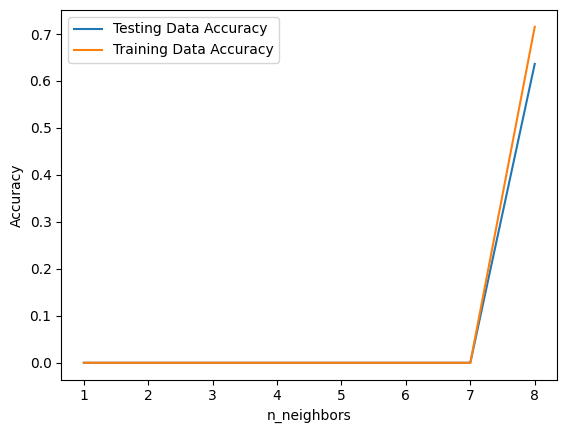

In [78]:
#Genearting Plot(KNN)
plt.plot(neighbors,test_accuracy,label='Testing Data Accuracy')
plt.plot(neighbors,train_accuracy,label='Training Data Accuracy')
plt.legend()
plt.xlabel("n_neighbors")
plt.ylabel("Accuracy")
plt.show()

In [79]:
#Implementation of SVM
from sklearn.svm import SVC
from sklearn.metrics import classification_report
svclassifier = SVC(kernel='linear')
svclassifier.fit(x_train,y_train)
y_pred2 = svclassifier.predict(x_test)
print("Confusion Matrix\n",confusion_matrix(y_test,y_pred2))
print("Classification Report:", classification_report(y_test,y_pred2))

Confusion Matrix
 [[970 308]
 [817 468]]
Classification Report:               precision    recall  f1-score   support

         0.0       0.54      0.76      0.63      1278
         1.0       0.60      0.36      0.45      1285

    accuracy                           0.56      2563
   macro avg       0.57      0.56      0.54      2563
weighted avg       0.57      0.56      0.54      2563



In [80]:
#Implementation of Logistic Regression
from sklearn.linear_model import LogisticRegression
classifier1 = LogisticRegression(random_state = 0)
classifier1.fit(x_train,y_train)
#Predicting Values
y_pred3 = classifier1.predict(x_test)
cm1 = confusion_matrix(y_test,y_pred3)
as1 = accuracy_score(y_test,y_pred3)
cr1 = classification_report(y_test,y_pred3)
print("Confusion Matrix:\n",cm1)
print("Accuracy Score:\n",as1)
print("Classification Report",cr1)

Confusion Matrix:
 [[689 589]
 [542 743]]
Accuracy Score:
 0.5587202497073742
Classification Report               precision    recall  f1-score   support

         0.0       0.56      0.54      0.55      1278
         1.0       0.56      0.58      0.57      1285

    accuracy                           0.56      2563
   macro avg       0.56      0.56      0.56      2563
weighted avg       0.56      0.56      0.56      2563



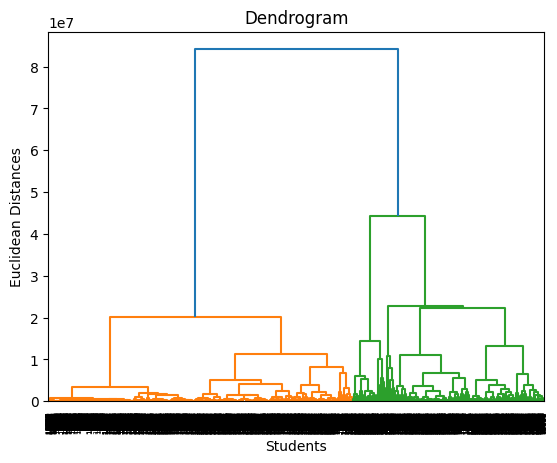

In [83]:
#Implementaion of HAC
import scipy.cluster.hierarchy as sch
dendo = sch.dendrogram(sch.linkage(x,method='ward'))
plt.title('Dendrogram')
plt.xlabel('Students')
plt.ylabel('Euclidean Distances')
plt.show()

In [84]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 5, affinity ='euclidean',linkage='ward')
y_hc = hc.fit_predict(x)
y_hc

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


array([0, 0, 4, ..., 4, 0, 3])

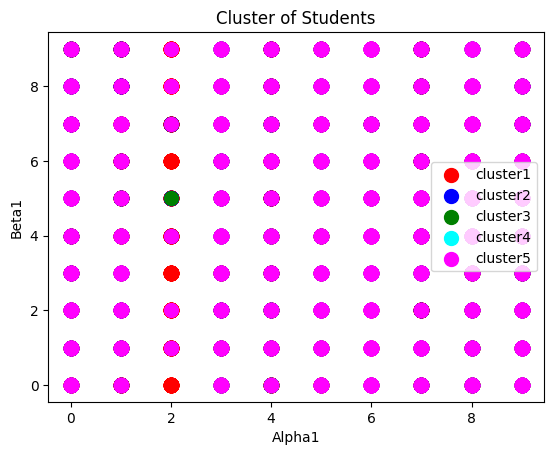

In [86]:
plt.scatter(x[y_hc==0,0],x[y_hc==0,1],s=100,c='red',label='cluster1')
plt.scatter(x[y_hc==1,0],x[y_hc==1,1],s=100,c='blue',label='cluster2')
plt.scatter(x[y_hc==2,0],x[y_hc==2,1],s=100,c='green',label='cluster3')
plt.scatter(x[y_hc==3,0],x[y_hc==3,1],s=100,c='cyan',label='cluster4')
plt.scatter(x[y_hc==4,0],x[y_hc==4,1],s=100,c='magenta',label='cluster5')
plt.title('Cluster of Students')
plt.xlabel('Alpha1')
plt.ylabel('Beta1')
plt.legend()
plt.show()

THANK YOU!